In [58]:
# just preprocessing the ceres data:
import os

import xarray as xr
import numpy  as np
import matplotlib.pyplot as plt

def open_ceres(data_path='home'):
    if data_path == 'home':    data_path = '/Users/admin/ceres/'
    if data_path == 'levante': data_path = '/work/mh0926/m300872/ceres/'

    file_list = [data_path+e for e in os.listdir(data_path) if '.nc' in e]
    return xr.open_mfdataset(file_list)
    
def discard_variables(dataset, yes_list=['time', 'lat', 'lon',
            'cldarea_high_1h', 'cldarea_mid_high_1h', 'cldarea_mid_low_1h', 'cldarea_low_1h', 'cldarea_total_1h', 
            'adj_atmos_lw_down_clr_surface_1h', 'adj_atmos_lw_up_clr_surface_1h', 'adj_atmos_sw_down_clr_surface_1h', 
            'adj_atmos_sw_up_clr_surface_1h', 'dj_atmos_lw_down_all_surface_1h', 'adj_atmos_lw_up_all_surface_1h', 
            'adj_atmos_sw_down_all_surface_1h', 'adj_atmos_sw_up_all_surface_1h', 'adj_atmos_lw_down_all_surface_1h']):
    no_list  = [name for name in list(dataset.variables) if name not in yes_list]
    dataset = dataset.drop(labels=no_list)
    for var in list(dataset.variables):
        dataset[var].attrs['short_name'] = var
    return dataset

 #    for var in ['cldarea_high_1h', 'cldarea_mid_high_1h', 'ldarea_mid_low_1h', 'cldarea_low_1h', 'cldarea_total_1h', 'adj_atmos_sw_up_all_surface_1h', 
 # 'adj_atmos_sw_down_all_surface_1h', 'adj_atmos_lw_up_all_surface_1h', 'adj_atmos_lw_down_all_surface_1h', 'adj_atmos_sw_up_clr_surface_1h', 
 # 'adj_atmos_sw_down_clr_surface_1h', 'adj_atmos_lw_up_clr_surface_1h', 'adj_atmos_lw_down_clr_surface_1h']
    
    
def add_radiation_budgets(dataset):
    # # # calculate radiation budgets
    calculations = [
        {'short_name' : 'lw_net_all', 'long_name' : 'All-Sky Longwave Net Flux, Hourly Daily Means', 
         'components' : ['adj_atmos_lw_up_all_surface_1h', 'adj_atmos_lw_down_all_surface_1h'], 
         'weights' : [1,1]},
        {'short_name' : 'sw_net_all', 'long_name' : 'All-Sky Shortwave Net Flux, Hourly Daily Means', 
         'components' : ['adj_atmos_sw_up_all_surface_1h', 'adj_atmos_sw_down_all_surface_1h'], 
         'weights' : [1,1]},
        {'short_name' : 'lw_net_clr', 'long_name' : 'Clear-Sky Longwave Net Flux, Hourly Daily Means', 
         'components' : ['adj_atmos_lw_up_clr_surface_1h', 'adj_atmos_lw_down_clr_surface_1h'], 
         'weights' : [1,1]},
        {'short_name' : 'sw_net_clr', 'long_name' : 'Clear-Sky Shortwave Net Flux, Hourly Daily Means', 
         'components' : ['adj_atmos_sw_up_clr_surface_1h', 'adj_atmos_sw_down_clr_surface_1h'],
         'weights' : [1,1]},
        {'short_name' : 'net_all', 'long_name' : 'All-Sky Net Radiation Flux, Hourly Daily Means', 
         'components' : ['sw_net_all', 'lw_net_all'], 
         'weights' : [1,1]},
        {'short_name' : 'net_clr', 'long_name' : 'Clear-Sky Net Radiation Flux, Hourly Daily Means', 
         'components' : ['sw_net_clr', 'lw_net_clr'], 
         'weights' : [1,1]},
        {'short_name' : 'cre', 'long_name' : 'Net Cloud Radiative Effect, Hourly Daily Means', 
         'components' : ['net_all', 'net_clr'], 
         'weights' : [-1,1]},
    ]
    for var in calculations:
        dataset[var['short_name']] = dataset[var['components'][0]] * var['weights'][0] + dataset[var['components'][1]] * var['weights'][1]
        dataset[var['short_name']].attrs['short_name'] = var['short_name']
        dataset[var['short_name']].attrs['long_name'] = var['long_name']
    return dataset







def summary(data):
    print('\nDimensions:')
    for key, value in data.dims.items():
        print(key.ljust(20), ': ', value)

    print('\nVariables:')
    namedict = dict(zip(
        #[data[d].standard_name for d in data.data_vars], 
        [d for d in data.data_vars], 
        [data[d].long_name for d in data.data_vars]))
    for key, value in namedict.items():
        print(key.ljust(20), ': ', value)


ceres = open_ceres()
ceres = discard_variables(ceres)
ceres = add_radiation_budgets(ceres)
summary(ceres)


Dimensions:
time                 :  192168
lon                  :  20
lat                  :  10

Variables:
cldarea_high_1h      :  Cloud Parameters: Cloud Area Fraction, High clouds, Hourly Daily Means
cldarea_mid_high_1h  :  Cloud Parameters: Cloud Area Fraction, Mid-High clouds, Hourly Daily Means
cldarea_mid_low_1h   :  Cloud Parameters: Cloud Area Fraction, Mid-Low clouds, Hourly Daily Means
cldarea_low_1h       :  Cloud Parameters: Cloud Area Fraction, Low clouds, Hourly Daily Means
cldarea_total_1h     :  Cloud Parameters: Cloud Area Fraction, Total clouds, Hourly Daily Means
adj_atmos_sw_up_all_surface_1h :  Adjusted All-Sky Profile Fluxes Shortwave Flux Up, Surface All-Sky conditions, Hourly Daily Means
adj_atmos_sw_down_all_surface_1h :  Adjusted All-Sky Profile Fluxes Shortwave Flux Down, Surface All-Sky conditions, Hourly Daily Means
adj_atmos_lw_up_all_surface_1h :  Adjusted All-Sky Profile Fluxes Longwave Flux Up, Surface All-Sky conditions, Hourly Daily Means
adj_atmos

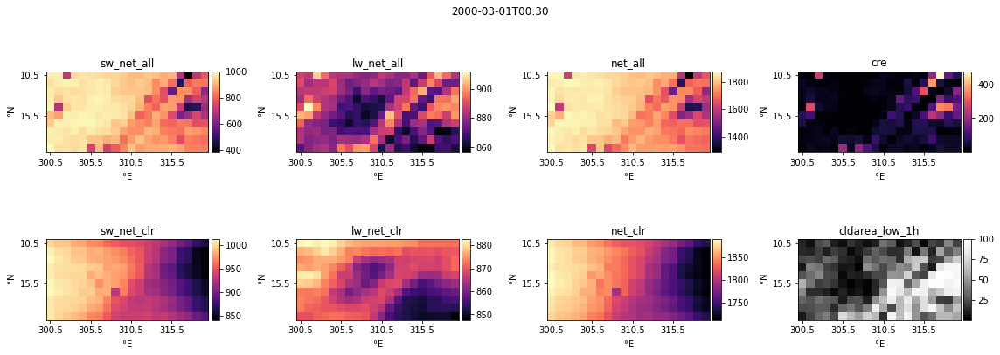

In [71]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

def var_show(ax, data, var, time, cmap='magma'):
    variable = data[var].isel(time=time).values # extract values
    ax.invert_yaxis() # lat values are degrees north
    ax.set_title(data[var].short_name)
    ax.set_ylabel('$\degree$N')
    ax.set_xlabel('$\degree$E')
    tick_res = 5
    lon_ticks = data.lon.values
    lat_ticks = data.lat.values
    ax.set_xticks(np.arange(0,len(lon_ticks),tick_res))
    ax.set_xticklabels(lon_ticks[::tick_res])
    ax.set_yticks(np.arange(0,len(lat_ticks),tick_res))
    ax.set_yticklabels(lat_ticks[::tick_res])
    im = ax.imshow(variable, cmap=cmap)
    # https://stackoverflow.com/questions/23876588/matplotlib-colorbar-in-each-subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical')
    return im


# this is the kind of plot i want to animate
data = ceres
cmap = plt.cm.get_cmap('magma')
blues = plt.cm.get_cmap('Greys').reversed()

time = 4000



fig, axs = plt.subplots( 2, 4, figsize=(16,6))
fig.suptitle(ceres.time[0].values.__str__()[0:-13])

var_show(axs[0,0], ceres, 'sw_net_all', time)
var_show(axs[1,0], ceres, 'sw_net_clr', time)
var_show(axs[0,1], ceres, 'lw_net_all', time)
var_show(axs[1,1], ceres, 'lw_net_clr', time)
var_show(axs[0,2], ceres, 'net_all',    time)
var_show(axs[1,2], ceres, 'net_clr',    time)
var_show(axs[0,3], ceres, 'cre',        time)
var_show(axs[1,3], ceres, 'cldarea_low_1h', time, cmap=blues)
# axs[3,1].axis('off')

plt.tight_layout()

plt.show()

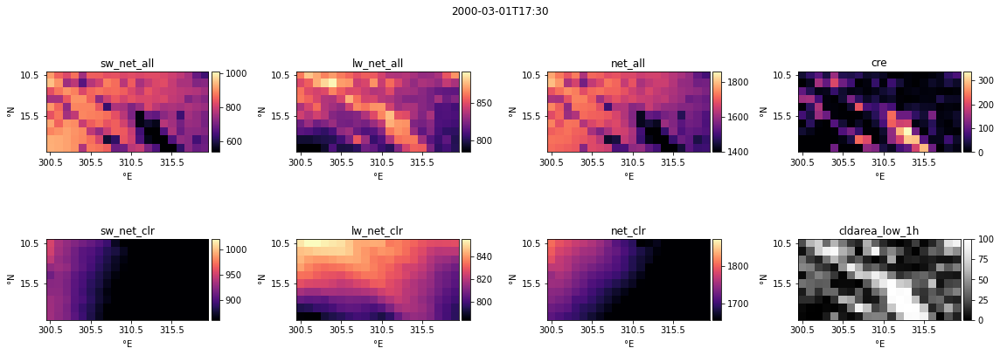

In [104]:
%matplotlib inline
# import numpy as np
# import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

def var_show(ax, data, var, time, cmap='magma', minmax=None):
    variable = data[var].isel(time=time).values # extract values
    ax.invert_yaxis() # lat values are degrees north
    ax.set_title(data[var].short_name)
    ax.set_ylabel('$\degree$N')
    ax.set_xlabel('$\degree$E')
    tick_res = 5
    lon_ticks = data.lon.values
    lat_ticks = data.lat.values
    ax.set_xticks(np.arange(0,len(lon_ticks),tick_res))
    ax.set_xticklabels(lon_ticks[::tick_res])
    ax.set_yticks(np.arange(0,len(lat_ticks),tick_res))
    ax.set_yticklabels(lat_ticks[::tick_res])
    if minmax:
        im = ax.imshow(variable, cmap=cmap, vmin=minmax[0], vmax=minmax[1])
    else:
        im = ax.imshow(variable, cmap=cmap)
    # https://stackoverflow.com/questions/23876588/matplotlib-colorbar-in-each-subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical')
    return im


data = ceres
magma = plt.cm.get_cmap('magma')
blues = plt.cm.get_cmap('Greys').reversed()

time_offset = 16


fig, axs = plt.subplots( 2, 4, figsize=(16,6))
fig.suptitle(ceres.time[0].values.__str__()[0:-13])

im = []
subplots = [
    ('sw_net_all',     (0,0), magma, (0,1000)),
    ('sw_net_clr',     (1,0), magma, (0,1000)),
    ('lw_net_all',     (0,1), magma, (0,1000)),
    ('lw_net_clr',     (1,1), magma, (0,1000)),
    ('net_all',        (0,2), magma, (0,2000)),
    ('net_clr',        (1,2), magma, (0,2000)),
    ('cre',            (0,3), magma, (0,5000)),
    ('cldarea_low_1h', (1,3), blues, (0,5000))
]
for sp in subplots:
    im.append(var_show(axs[sp[1][0],sp[1][1]], ceres, sp[0], time_offset, cmap=sp[2]))#, minmax=sp[3]) )
plt.tight_layout()

# initialization function: plot the background of each frame
def init():
    for i,e in enumerate(im):
        variable = ceres[subplots[i][0]].isel(time=time_offset).values
        e.set_data(variable)     
    return (radmap,)

# animation function. This is called sequentially

def animate(k):
    for i,e in enumerate(im):
        variable = ceres[subplots[i][0]].isel(time=k+time_offset).values
        e.set_data(variable)
    fig.suptitle(ceres.time[k+time_offset].values.__str__()[0:-13])
    return (radmap,)

# call the animator. blit=True means only re-draw the parts that have changed.
# full documentation: https://matplotlib.org/stable/api/_as_gen/matplotlib.animation.FuncAnimation.html
frames = 2
anim0 = animation.FuncAnimation(fig, animate, init_func=init, blit=True, frames=frames, interval=500)
HTML(anim0.to_html5_video())

In [99]:
frames = 100
anim1 = animation.FuncAnimation(fig, animate, init_func=init, blit=True, frames=frames, interval=500)
HTML(anim1.to_html5_video())

In [105]:
frames = 1000
anim2 = animation.FuncAnimation(fig, animate, init_func=init, blit=True, frames=frames, interval=500)
HTML(anim2.to_html5_video())

In [101]:
# save the video
file_ext  = '.gif'
file_ext  = '.mp4'
file_name = 'overview_'+str(100)+file_ext
anim1.save(file_name,dpi=300)
print('saved as '+file_name)


KeyboardInterrupt



In [106]:

file_name = 'overview_'+str(frames)+file_ext
anim2.save(file_name,dpi=300)
print('saved as '+file_name)

saved as overview_1000.mp4
